In [1]:
%load_ext autoreload
%autoreload complete

In [2]:
from math import ceil
from functools import partial
from pathlib import Path
import json
import concurrent.futures

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs
import xarray as xr
import cf_xarray as cfxr
import dask.array
import cftime
import scipy
import cmocean

from lmrecon.io import IntakeESMLoader, save_mfdataset, open_mfdataset
from lmrecon.plotting import plot_field, format_plot, save_plot, add_subplot_headers, subplots_cartopy, get_field_scaling
from lmrecon.plotting_config import set_plotting_theme
from lmrecon.util import (
    stack_state,
    unstack_state,
    is_dask_array,
    get_data_path,
    to_math_order,
    is_ocean_field,
)
from lmrecon.logger import logging_disabled
from lmrecon.eof import EOF
from lmrecon.mapper import PhysicalSpaceForecastSpaceMapper
from lmrecon.lim import LIM
from lmrecon.da import create_initial_ensemble_from_sample, create_initial_ensemble_from_perturbations
from lmrecon.stats import area_weighted_mean, area_weighted_rmse, ce, compute_field_stds, average_annually, rmse, compute_spread_skill_ratio
from lmrecon.time import month_name, Season
from lmrecon.scripts.train_lim import train_lim

set_plotting_theme()

In [3]:
# import dask
# from distributed import Client

# client = Client(n_workers=dask.system.CPU_COUNT // 2, threads_per_worker=1)

In [3]:
def load_lim(mapper_id):
    lim = train_lim(mapper_id)
    training_data_path = (get_data_path() / "mapper" / mapper_id)

    with (training_data_path / "metadata.json").open("r") as f:
        physical_dataset = Path(json.load(f)["physical_dataset"])
        print(physical_dataset)
    
    mapper = PhysicalSpaceForecastSpaceMapper.load(training_data_path / "mapper.pkl")
    data_lim_training = open_mfdataset(training_data_path / f"seasonal_anomalies")["data"]
    ds_ver = xr.open_zarr(get_data_path() / physical_dataset)

    return lim, mapper, data_lim_training, ds_ver

In [4]:
mapper_id = "2026-02-22T13-39-35"  # MPI
lim, mapper, data_lim_training, ds_ver = load_lim(mapper_id)

2026-03-22 17:41:01    INFO Training LIM on 2026-02-22T13-39-35 (7399 samples, state size 121)
2026-03-22 17:41:01    INFO Found 8 modes with negative eigenvalues in the noise covariance Q
2026-03-22 17:41:01    INFO Rescaling 113 remaining eigenvalues of Q by 0.94


cmip6/MPI-ESM1-2-LR/past2k/seasonal_anomalies_detrended.zarr


In [5]:
plot_folder = get_data_path() / "mapper" / mapper_id / "plots"

# LIM matrices

tas 0.9998648466008923 0.9998648466008917
tas 0
tos 0.9998648466008925 0.999864846600892
tos 21
eei 0.999864846600892 0.9998648466008914
eei 42
rsut 0.9998648466008919 0.9998648466008921
rsut 58
rlut 0.999864846600892 0.9998648466008911
rlut 74
ohc300 0.9998648466008919 0.999864846600892
ohc300 85
siconcn 0.9998648466008915
siconcs 0.9998648466008921


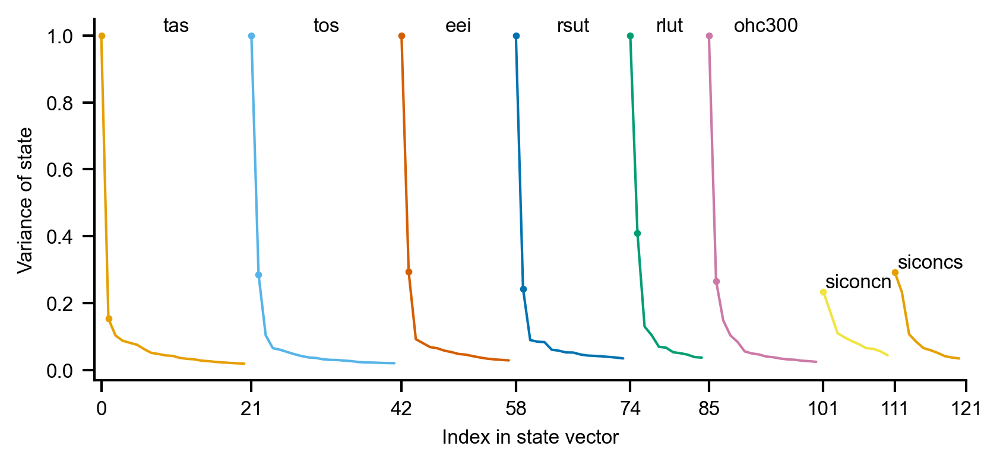

In [6]:
def plot_training_data_variance():
    fig, ax = plt.subplots()

    var = data_lim_training.var("time").compute()
    idx_starts = []

    # Assuming only individual modes
    idx = 0
    for i, f in enumerate(mapper.k):
        c = f"C{i}"
        length = mapper.k[f]
        if f in mapper.separate_global_mean:
            length += 1
            ax.scatter(idx+1, var.isel(state=idx+1), c=c)
            print(f, var.isel(state=idx).item(), var.isel(state=slice(idx+1, idx+length)).sum().item())
            print(f, idx)
        else:
            print(f, var.isel(state=slice(idx, idx+length)).sum().item())
        
        var_field = var.isel(state=slice(idx, idx+length))
        ax.plot(var_field.state, var_field, label=f, c=c)
        ax.scatter(idx, var.isel(state=idx), c=c)
        idx_starts.append(idx)
        ax.text(idx + length/2, var_field.max(), f, ha="center", va="bottom")
        
        idx += length
    assert idx == mapper.n_reduced_state

    ax.set_xlabel("Index in state vector")
    ax.set_ylabel("Variance of state")
    ax.set_xticks(idx_starts + [mapper.n_reduced_state])
    ax.set_xlim(-1, mapper.n_reduced_state)

plot_training_data_variance()

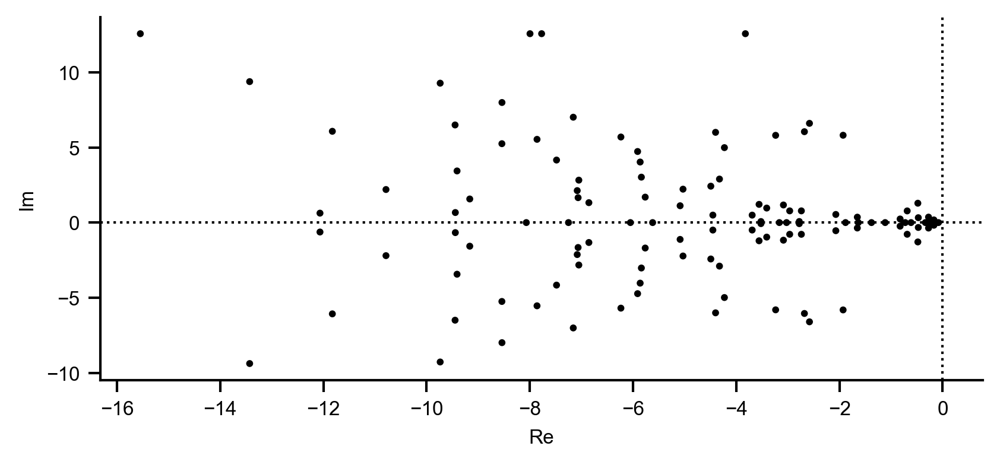

In [7]:
def plot_eigenvalues():
    fig, ax = plt.subplots()

    eigs = np.linalg.eigvals(lim.L)
    ax.axvline(0, ls=":", c="black")
    ax.axhline(0, ls=":", c="black")
    ax.scatter(np.real(eigs), np.imag(eigs), c=np.where(np.real(eigs) < 0, "black", "red"))
    ax.set_xlabel("Re")
    ax.set_ylabel("Im")
    # ax.set_aspect("equal")

    format_plot()
    save_plot(plot_folder, "eigenvalues")

plot_eigenvalues()

Lower time constant -> faster response

Fastest mode: tau = 0.02 years
Slowest mode: tau = 1.96 years


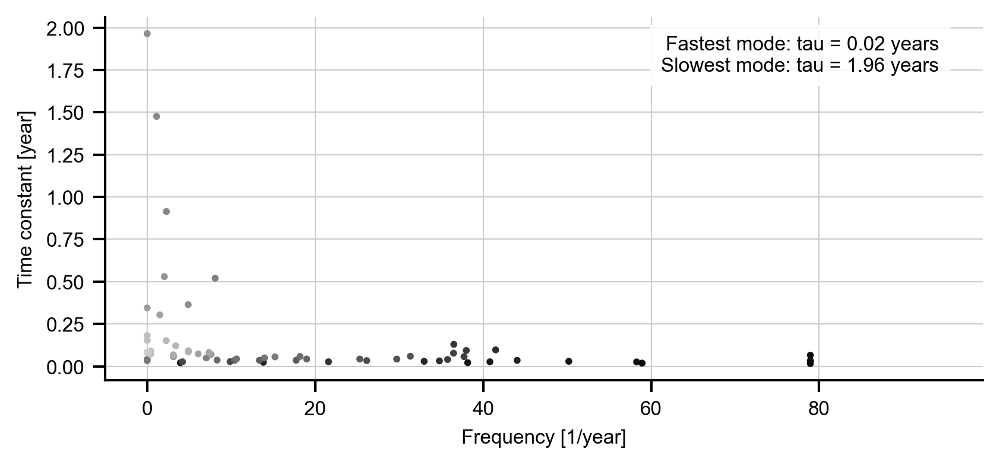

In [8]:
def plot_frequency_spectrum():
    fig, ax = plt.subplots()

    eigs = np.linalg.eigvals(lim.L)
    eigs = eigs[np.imag(eigs) >= 0]
    fs = np.imag(eigs) / 2 * np.pi
    taus = -1 / np.real(eigs)

    # Adjust for frequency
    taus *= lim.tau
    fs /= lim.tau

    cmap = mpl.colors.LinearSegmentedColormap.from_list(
        "cmap",
        [
            mpl.colors.to_rgb("white"),
            mpl.colors.to_rgb("black"),
        ],
    )(np.linspace(1, 0.2, len(eigs)))
    
    ax.scatter(fs, taus, color=cmap)
    ax.set_xlabel("Frequency [1/year]")
    ax.set_ylabel("Time constant [year]")
    ax.set_xlim([-5, ax.get_xlim()[1] * 1.2])
    # ax.set_xscale("log")

    print(f"Fastest mode: tau = {np.min(taus):.2f} years")
    print(f"Slowest mode: tau = {np.max(taus):.2f} years")
    ax.text(0.95, 0.95, f"Fastest mode: tau = {np.min(taus):.2f} years\nSlowest mode: tau = {np.max(taus):.2f} years",
            transform=ax.transAxes, ha='right', va='top', bbox=dict(facecolor='white', alpha=0.8))
    

    # secax = ax.secondary_xaxis("top", functions=(lambda x: 1 / x, lambda x: 1 / x))
    # secax.set_xlabel("Period [year]")

    # ax_hist = fig.add_subplot(111, label="2", frame_on=False)
    # ax_hist.set_axis_off()
    # ax_hist.hist(taus, 30, orientation="horizontal", density=True)
    # ax_hist.set_xlim([3, 0])in

    format_plot(major_grid=True)
    save_plot(plot_folder, "freq_spectrum")


plot_frequency_spectrum()

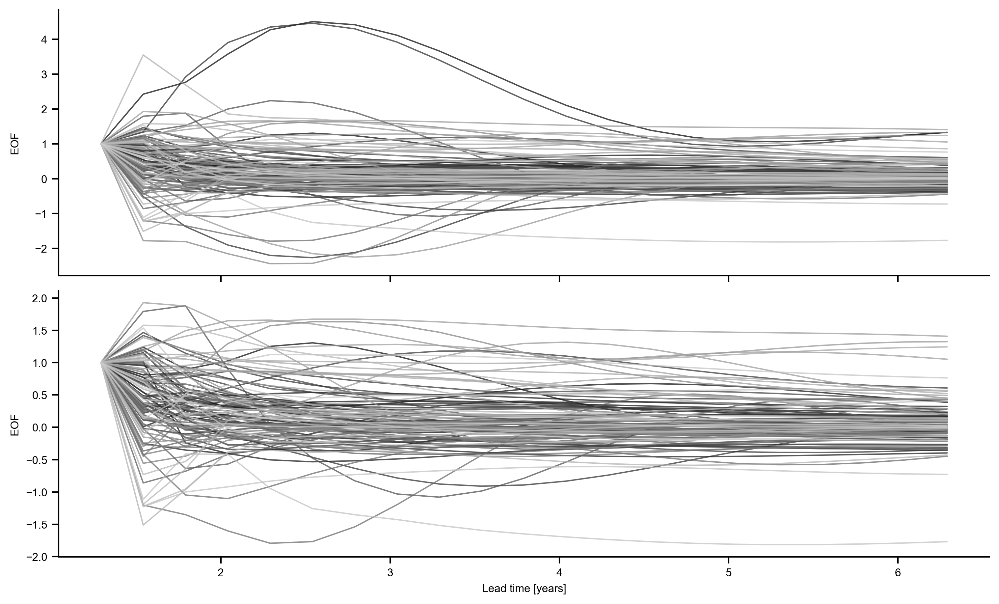

In [9]:
def plot_forecast_eof(n_steps=15):
    ones = xr.DataArray(
        dask.array.ones((len(data_lim_training.state), 1)), coords=dict(state=data_lim_training.state, time=data_lim_training.isel(time=0).time)
    )
    fc_eof = lim.forecast_deterministic(ones, n_steps)
    # fc_eof = lim.forecast(data_lim_training.isel(time=0), n_steps)

    fig, axs = plt.subplots(2, sharex=True, figsize=(10, 6))

    cmap = mpl.colors.LinearSegmentedColormap.from_list(
        "cmap",
        [
            mpl.colors.to_rgb("white"),
            mpl.colors.to_rgb("black"),
        ],
    )(np.linspace(1, 0.2, len(fc_eof.state)))

    for state, color in zip(fc_eof.state, cmap):
        y = fc_eof.isel(state=state)
        axs[0].plot(y.time, y, color=color, alpha=0.7)
        if np.max(np.abs(y)) < 2:
            axs[1].plot(y.time, y, color=color, alpha=0.7)

    axs[1].set_xlabel("Lead time [years]")
    axs[0].set_ylabel("EOF")
    axs[1].set_ylabel("EOF")
    # axs[1].set_ylim([-3, 3])

    format_plot()


plot_forecast_eof(20)

100%|██████████| 5385/5385 [00:01<00:00, 2859.15step/s]


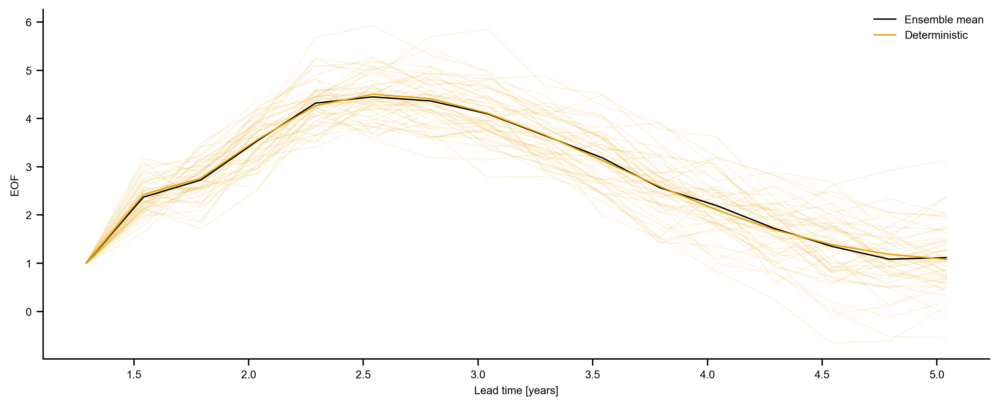

In [10]:
def plot_forecast_stochastic_ones(n_steps=15, n_ensemble=100, eof=0):
    ones = to_math_order(
        xr.DataArray(
            dask.array.ones((len(data_lim_training.state), n_ensemble)),
            dims=["state", "ens"],
            coords=dict(state=data_lim_training.state, ens=range(n_ensemble), time=data_lim_training.isel(time=0).time),
        )
    )
    fc_eof = lim.forecast_stochastic(ones, n_steps, int(1440 * lim.tau)).isel(state=eof)
    fc_eof_det = lim.forecast_deterministic(ones[:, 0], n_steps).isel(state=eof)

    fig, ax = plt.subplots(sharex=True, figsize=(10, 4))

    for i in range(n_ensemble):
        ax.plot(fc_eof.time, fc_eof.isel(ens=i), color="C0", alpha=0.1)

    ax.plot(fc_eof.time, fc_eof.mean("ens"), label="Ensemble mean", c="black")
    ax.plot(fc_eof_det.time, fc_eof_det, label="Deterministic", c="C0")

    ax.set_xlabel("Lead time [years]")
    ax.set_ylabel("EOF")
    # axs[1].set_ylim([-3, 3])
    ax.legend()

    format_plot()


plot_forecast_stochastic_ones(n_steps=15, n_ensemble=50, eof=0)

100%|██████████| 21600/21600 [00:07<00:00, 2783.94step/s]


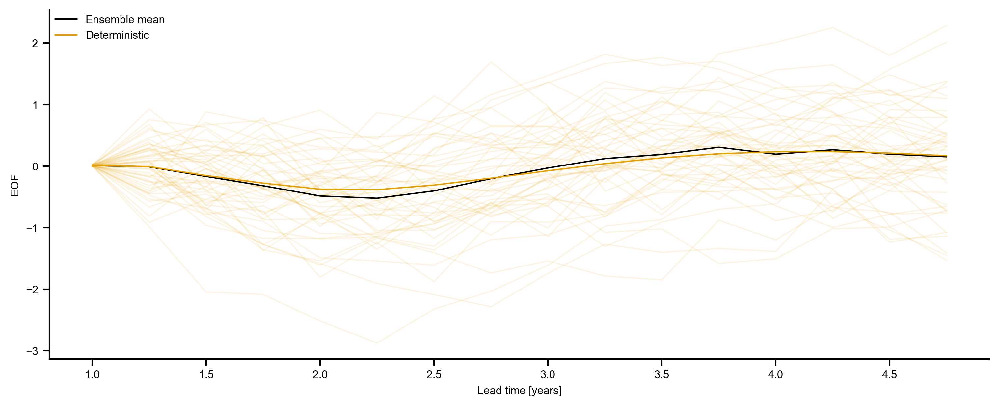

In [11]:
def plot_forecast_stochastic(n_steps=15, n_ensemble=100, eof=0):
    # initial_ensemble = to_math_order(create_initial_ensemble_from_sample(data_lim_training, n_ensemble, 0))
    initial_ensemble = to_math_order(create_initial_ensemble_from_perturbations(data_lim_training.isel(time=0), n_ensemble, year_start=1, std=1))

    fc_eof = lim.forecast_stochastic(initial_ensemble, n_steps, 1440).isel(state=eof)
    fc_eof_det = lim.forecast_deterministic(initial_ensemble.mean("ens"), n_steps).isel(state=eof)

    fig, ax = plt.subplots(sharex=True, figsize=(10, 4))

    for i in range(n_ensemble):
        ax.plot(fc_eof.time, fc_eof.isel(ens=i), color="C0", alpha=0.1)

    ax.plot(fc_eof.time, fc_eof.mean("ens"), label="Ensemble mean", c="black")
    ax.plot(fc_eof_det.time, fc_eof_det, label="Deterministic", c="C0")

    ax.set_xlabel("Lead time [years]")
    ax.set_ylabel("EOF")
    # axs[1].set_ylim([-3, 3])
    ax.legend()

    format_plot()


plot_forecast_stochastic(n_steps=15, n_ensemble=50, eof=0)

Ensemble initialized using "create_initial_ensemble_from_sample" has zero mean from beginning. This makes sense because sample is drawn from dataset with respect to which anomalies were calculated.

tas: 0-21
tos: 21-42
eei: 42-58
rsut: 58-74
rlut: 74-85
ohc300: 85-101
siconcn: 101-111
siconcs: 111-121


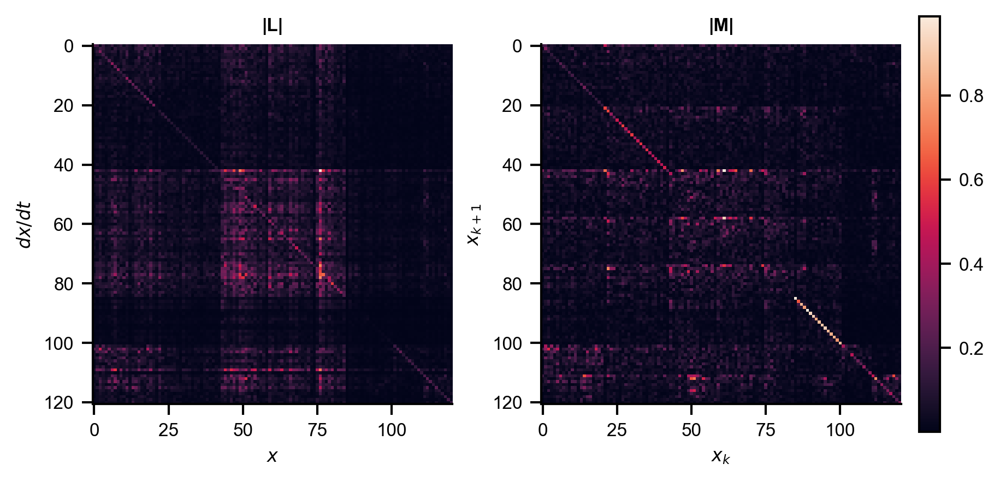

In [12]:
def plot_matrix_values(log=False):
    fig, axs = plt.subplots(1, 2, figsize=(6, 3))

    if log:
        tf = lambda x: np.log(np.abs(x))
        prefix = "log "
    else:
        tf = lambda x: np.abs(x)
        prefix = ""

    L = tf(lim.L)
    L /= L.max()
    M = tf(lim.G_tau)
    M /= M.max()

    ax = axs[0]
    ax.imshow(tf(lim.L))
    ax.set_title(prefix + "|L|")
    ax.set_xlabel("$x$")
    ax.set_ylabel("$dx/dt$")
    ax.tick_params(direction="out")

    ax = axs[1]
    im = ax.imshow(tf(lim.G_tau))
    ax.set_title(prefix + "|M|")
    ax.set_xlabel("$x_k$")
    ax.set_ylabel("$x_{k+1}$")
    ax.tick_params(direction="out")
    plt.colorbar(im)

    # Assuming only individual modes
    idx = 0
    for f in mapper.k:
        length = mapper.k[f]
        if mapper.separate_global_mean and f in mapper.separate_global_mean:
            length += 1
        print(f"{f}: {idx}-{idx + length}")
        idx += length
    assert idx == mapper.n_reduced_state

    format_plot()
    if not log:
        save_plot(plot_folder, "matrix_values")

plot_matrix_values()

tas: 0-21
tos: 21-42
eei: 42-58
rsut: 58-74
rlut: 74-85
ohc300: 85-101
siconcn: 101-111
siconcs: 111-121


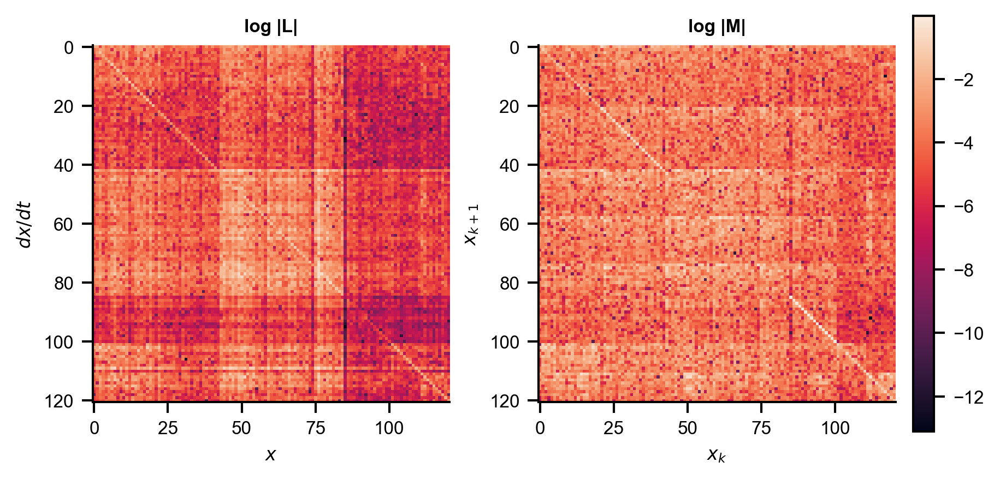

In [13]:
plot_matrix_values(log=True)

# Forecast verification

In [ ]:
lim_id = "2026-03-10T08-56-12"
fcs = xr.open_mfdataset((get_data_path() / "lim" / lim_id / "verification").glob("forecast-*.nc"))
trues = xr.open_mfdataset([p for p in (get_data_path() / "lim" / lim_id / "verification").glob("verification-*.nc") if "trunc" not in str(p)])
trues_trunc = xr.open_mfdataset((get_data_path() / "lim" / lim_id / "verification").glob("verification-trunc-*.nc"))
fields = list(fcs.keys())

In [33]:
fcs_mean = fcs  # Deterministic
# fcs_mean = fcs.mean("ens").compute()  # Stochastic

In [ ]:
def calculate_forecast_metrics(fcs, trues, fields=None):
    if fields:
        fcs = fcs[fields]
        trues = trues[fields]

    import dask.distributed
    with dask.distributed.Client(n_workers=dask.system.CPU_COUNT // 2, threads_per_worker=1):
        # Stack since xr.corr does not support Dataset as input
        corr = unstack_state(xr.corr(stack_state(fcs), stack_state(trues), dim=["case"]))
        corr_gm = unstack_state(xr.corr(stack_state(area_weighted_mean(fcs)), stack_state(area_weighted_mean(trues)), dim=["case"]))
        ce_ = ce(fcs, trues, dim=["case"])
        rmse_ = rmse(fcs, trues, mean_dims=["case"])
        return corr.compute(), corr_gm.compute(), ce_.compute(), rmse_.compute()

corr_full, corr_gm_full, ce_full, rmse_full = calculate_forecast_metrics(fcs_mean, trues)
corr_trunc, corr_gm_trunc, ce_trunc, rmse_trunc = calculate_forecast_metrics(fcs_mean, trues_trunc)

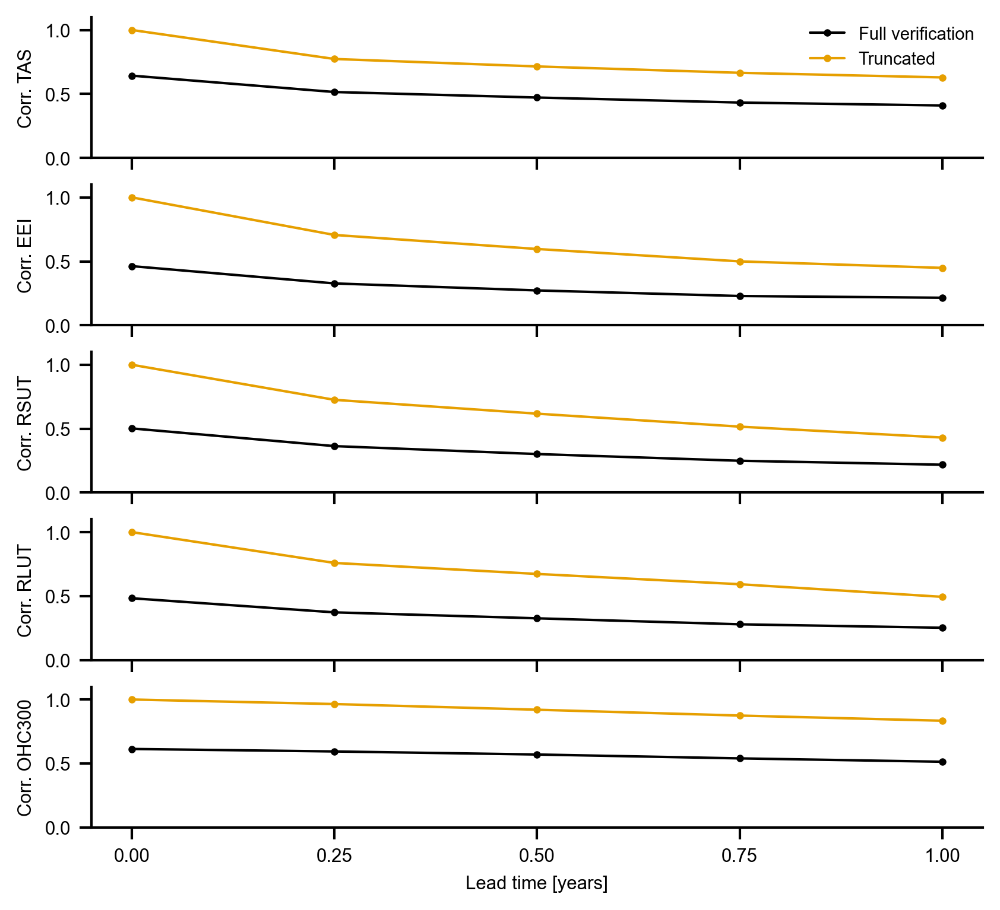

In [26]:
def plot_forecast_corr_evolution():
    fields = list(fcs.keys())
    fig, axs = plt.subplots(len(fields), figsize=(5.5, len(fields)), sharex=True)

    for ax, field in zip(axs, fields):
        full = area_weighted_mean(corr_full[field])
        trunc = area_weighted_mean(corr_trunc[field])
        # full = corr_gm_full[field]
        # trunc = corr_gm_trunc[field]
        ax.plot(full.time, full, "-o", c="black", label="Full verification")
        ax.plot(trunc.time, trunc, "-o", c="C0", label="Truncated")

    axs[0].legend()
    axs[-1].set_xlabel("Lead time [years]")
    for ax, field in zip(axs, fields):
        ax.set_ylabel(f"Corr. {field.upper()}")
        ax.set_ylim([0, 1.1])

    format_plot()
    # format_plot(major_grid=True, minor_grid=True)
    # for ax in axs:
    #     ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
    axs[0].set_xticks(corr_full.time)
    # save_plot(plot_folder, "forecast_corr_evolution")

plot_forecast_corr_evolution()

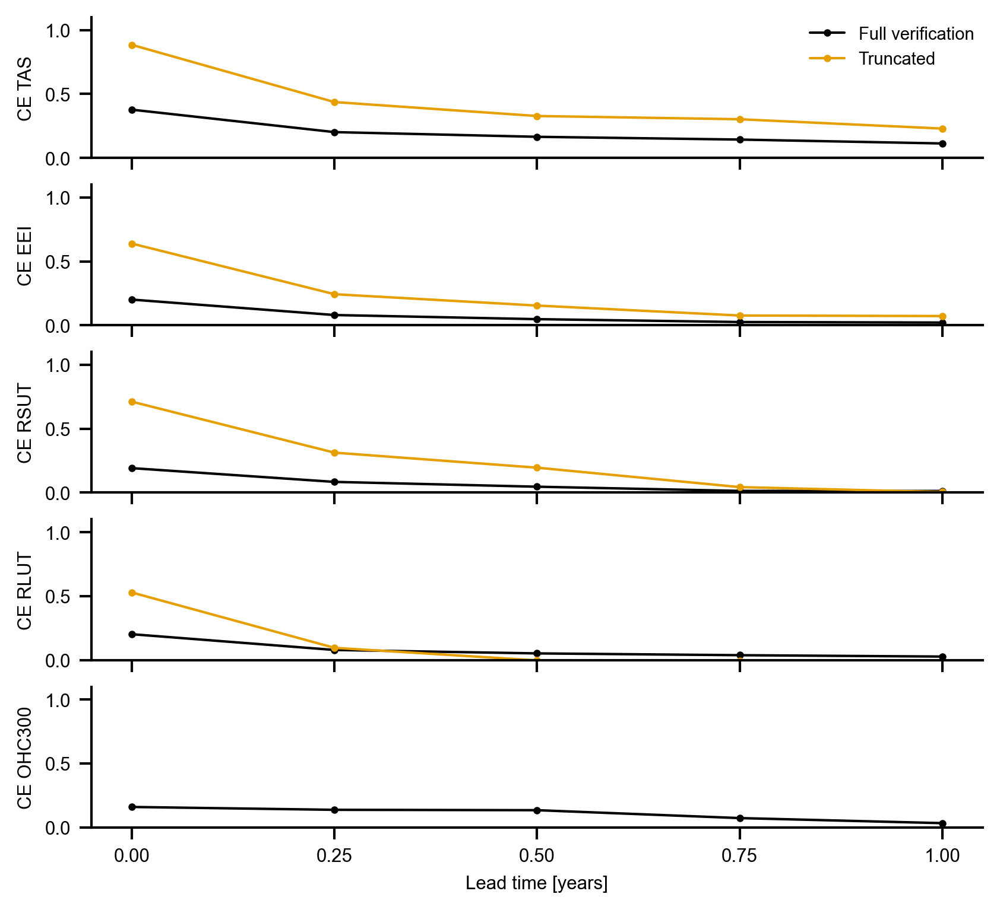

In [16]:
def plot_forecast_ce_evolution():
    fields = list(fcs.keys())
    fig, axs = plt.subplots(len(fields), figsize=(5.5, len(fields)), sharex=True)

    for ax, field in zip(axs, fields):
        ax.plot(ce_full.time, area_weighted_mean(ce_full[field]), "-o", c="black", label="Full verification")
        ax.plot(ce_trunc.time, area_weighted_mean(ce_trunc[field]), "-o", c="C0", label="Truncated")

    axs[0].legend()
    axs[-1].set_xlabel("Lead time [years]")
    for ax, field in zip(axs, fields):
        ax.set_ylabel(f"CE {field.upper()}")
        ax.set_ylim([0, 1.1])

    format_plot()
    # format_plot(major_grid=True, minor_grid=True)
    # for ax in axs:
    #     ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
    axs[0].set_xticks(ce_full.time)
    # save_plot(plot_folder, "forecast_ce_evolution")

plot_forecast_ce_evolution()

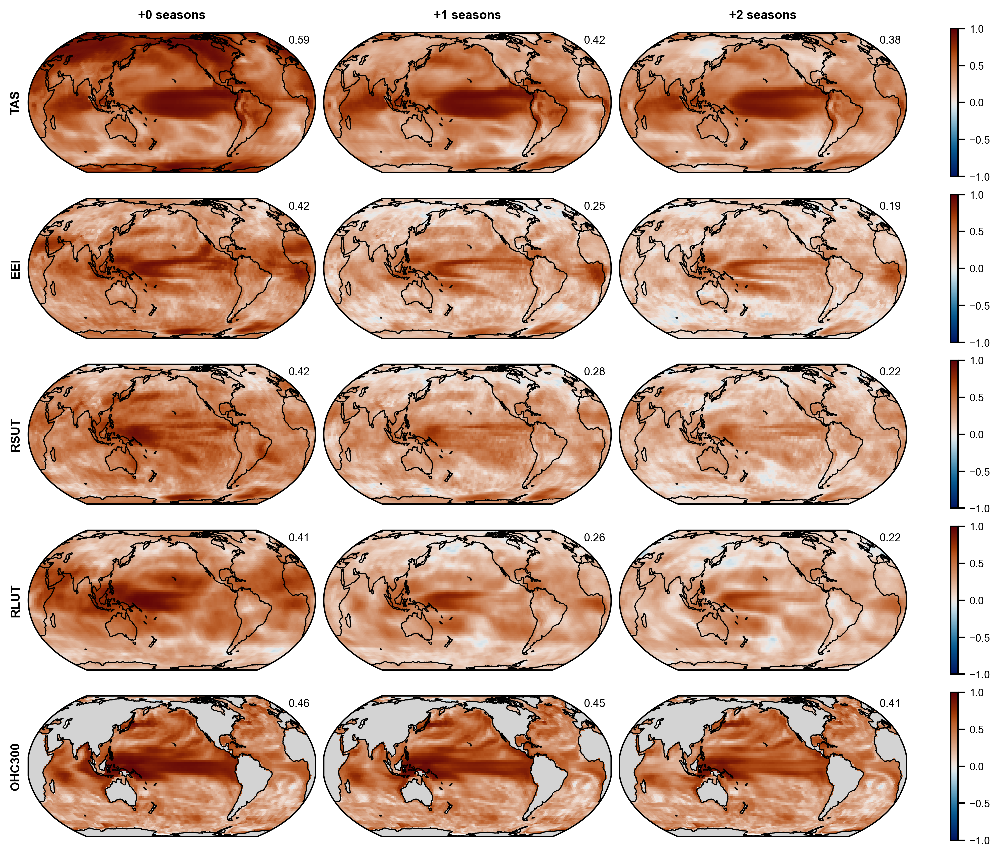

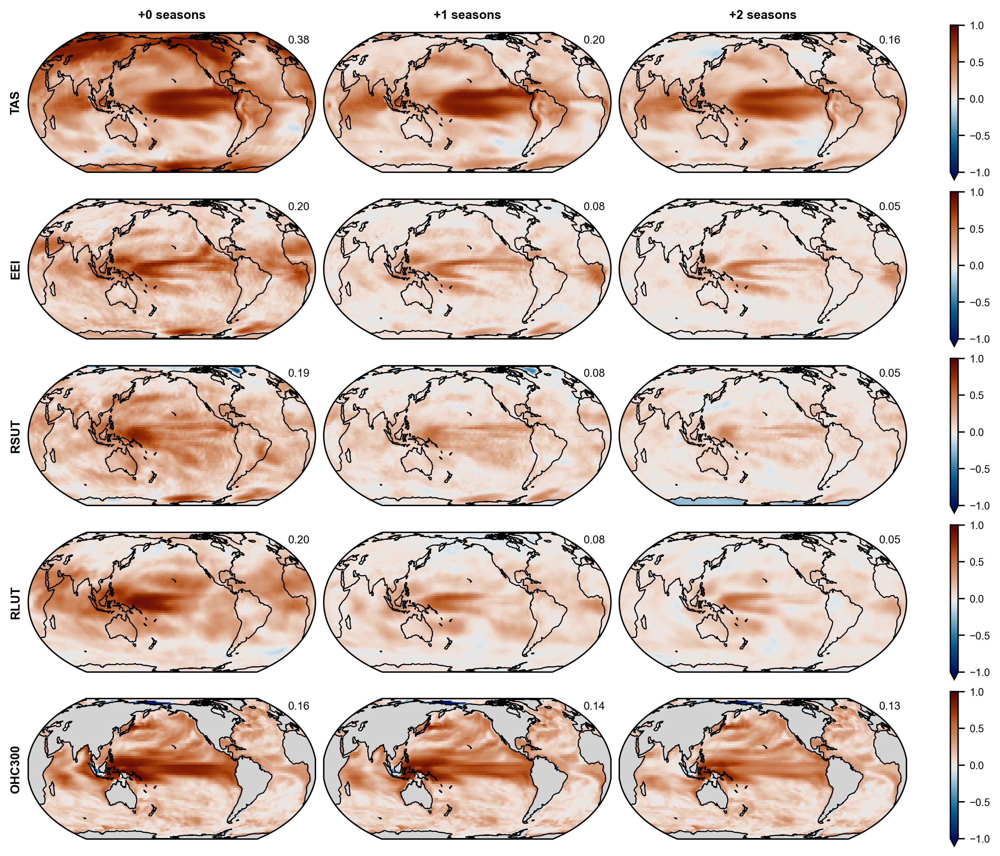

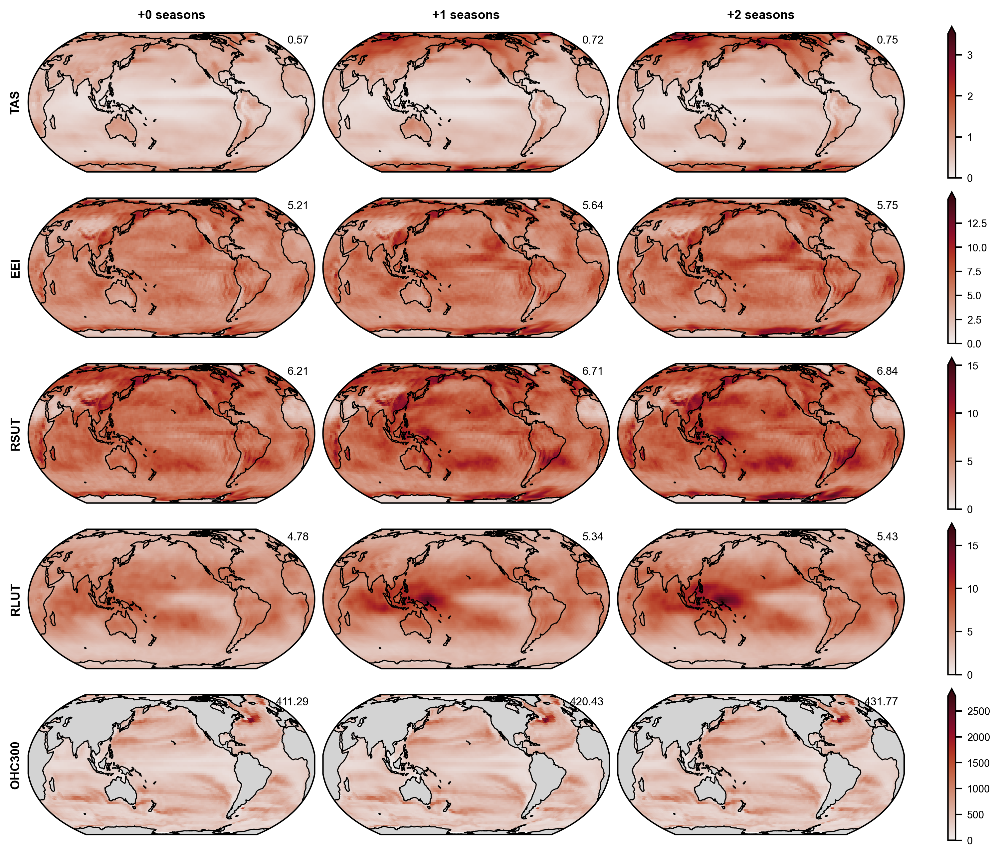

In [21]:
def plot_forecast_distribution(corr, type: str, n_steps=2):
    # fields = list(fcs.keys())
    # fields = ["tas", "eei", "ohc300"]
    fields = ["tas", "eei", "rsut", "rlut", "ohc300"]
    # fields = ["eei", "rsut", "rlut"]
    fig, axs = subplots_cartopy(len(fields), n_steps + 1, cbar_vertical=True)

    for i, field in enumerate(fields):
        axs_row = axs[i]

        if type.startswith("rmse"):
            vmin = 0
            vmax = None
            extend = "max"
            scaling = get_field_scaling(field)
        else:
            vmin = -1
            vmax = 1
            scaling = 1

            if type.startswith("corr"):
                extend = "neither"
            else:
                extend = "min"

        plot_field(
            axs_row,
            [corr[field].isel(time=time) / scaling for time in range(n_steps + 1)],
            cbar_orientation="vertical",
            shade_land=is_ocean_field(field),
            vmax=vmax, vmin=vmin,
            extend=extend,
        )

        for time, ax in enumerate(axs_row.flat[: n_steps + 1]):
            gm = area_weighted_mean(corr[field].isel(time=time) / scaling).item()
            ax.text(
                0.98, 0.98, f"{gm:.2f}",
                transform=ax.transAxes,
                ha="right", va="top",
                fontsize=8,
            )

    add_subplot_headers(list(map(str.upper, fields)), [f"+{season} seasons" for season in range(n_steps + 1)])

    # save_plot(plot_folder, f"forecast_{type}_distribution")

plot_forecast_distribution(corr_full, "corr")
# plot_forecast_distribution(corr_trunc, "corr_trunc")
plot_forecast_distribution(ce_full, "ce")
# plot_forecast_distribution(ce_trunc, "ce_trunc")
plot_forecast_distribution(rmse_full, "rmse")
# plot_forecast_distribution(rmse_trunc, "rmse_trunc")

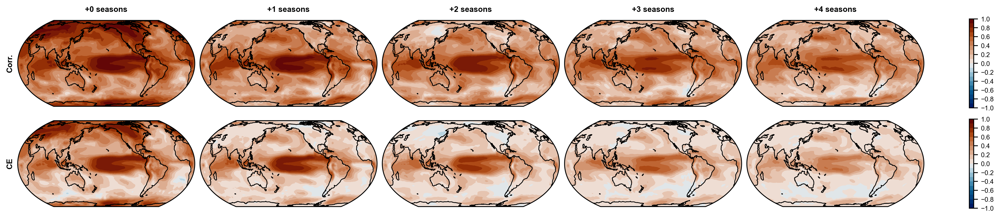

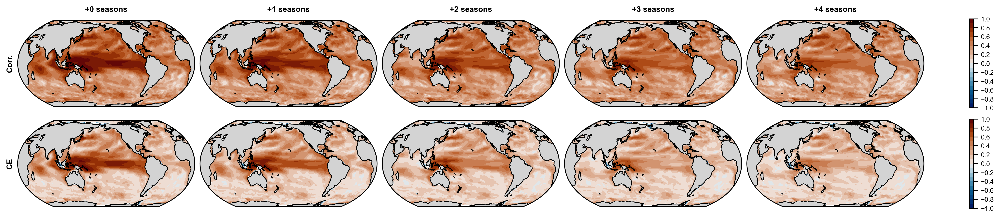

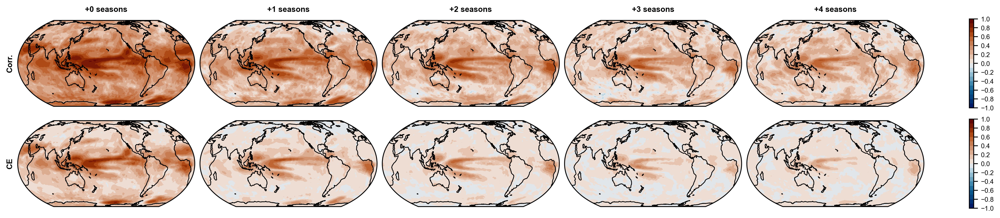

In [14]:
def plot_forecast_distribution2(corr, ce, field, n_steps=4):
    fig, axs = subplots_cartopy(2, n_steps + 1, cbar_vertical=True)

    for i, ds in enumerate([corr, ce]):
        axs_row = axs[i]
        for ax in axs_row.flat:
            ax.coastlines()

        plot_field(
            axs_row,
            [ds[field].isel(time=time) for time in range(n_steps + 1)],
            cbar_orientation="vertical",
            plot_method="contourf",
            levels=np.arange(-1, 1.01, 0.1),
            cbar_ticks=np.arange(-1, 1.01, 0.2),
            vmin=-1, vmax=1,
            cbar_aspect=20,
            extend="neither",
            shade_land=is_ocean_field(field),
        )

    add_subplot_headers(["Corr.", "CE"], [f"+{season} seasons" for season in range(n_steps + 1)])

plot_forecast_distribution2(corr_full, ce_full, "tas")
plot_forecast_distribution2(corr_full, ce_full, "ohc300")
plot_forecast_distribution2(corr_full, ce_full, "eei")

Deterministic and stochastic forecast have same correlation behavior.

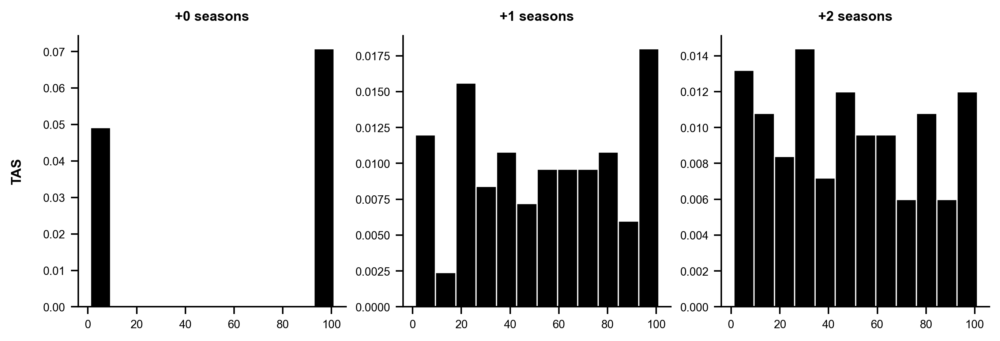

In [38]:
def plot_rank_histogram(fcs, trues, fields=["tas"]):
    fig, axs = plt.subplots(len(fields), len(fcs.time), figsize=(len(fcs.time) * 3, len(fields) * 3))
    axs = np.atleast_2d(axs)

    # Calculate rank of global means
    fcs = area_weighted_mean(fcs)
    trues = area_weighted_mean(trues)
    n_bins = 1 + len(fcs.ens)

    for i, field in enumerate(fields):
        for j, time in enumerate(fcs.time):
            fcs_time = fcs.sel(time=time)[field]
            trues_time = trues.sel(time=time)[field]
            ranks = scipy.stats.rankdata(np.hstack([trues_time.data[:, np.newaxis], fcs_time.data]), axis=1)[:, 0]
            axs[i, j].hist(ranks, density=True, bins=n_bins // 8, fc="black")

    add_subplot_headers(list(map(str.upper, fields)), [f"+{step} seasons" for step in range(len(fcs.time.data))])
    # save_plot(plot_folder, "forecast_rank_histogram")

plot_rank_histogram(fcs, trues)

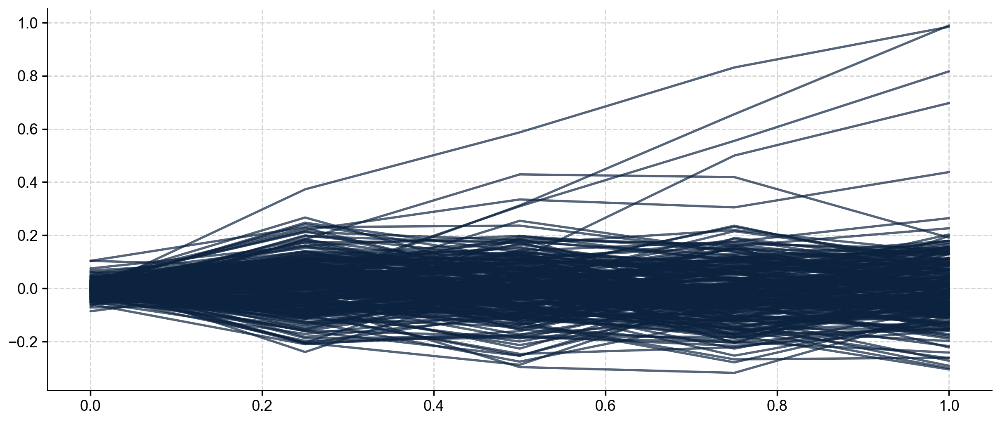

In [ ]:
def plot_forecast_difference(fcs, trues, field="tas"):
    fig, ax = plt.subplots()

    fcs = area_weighted_mean(fcs[field]).mean("ens")
    trues = area_weighted_mean(trues[field])
    diff = fcs - trues

    for i in diff.case:
        ax.plot(diff.time, diff.sel(case=i), color="C0", alpha=0.7)

    ax.legend()

plot_forecast_difference(fcs, trues)

[1.         0.73838373 0.61137634 0.4754815  0.36235602]


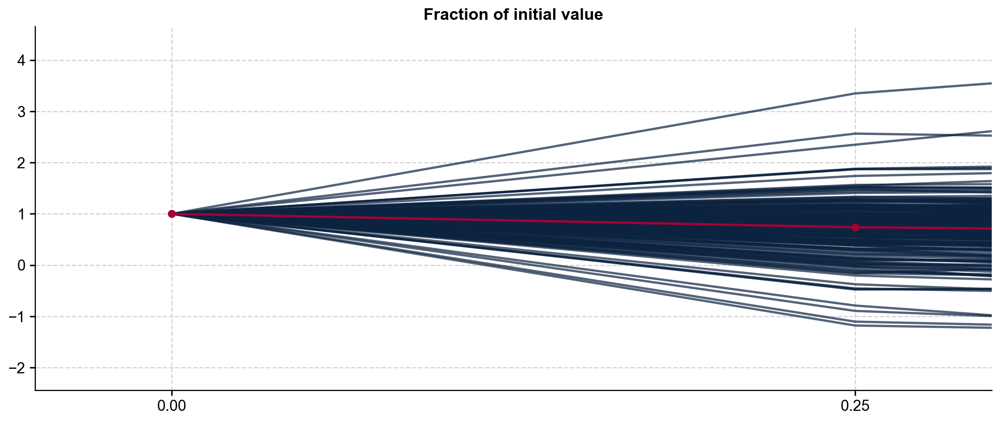

In [ ]:
def plot_forecast_decay(field="tas"):
    fig, ax = plt.subplots()

    fcs_global_mean = area_weighted_mean(fcs_mean[field])#.isel(case=slice(50))
    fcs_global_mean = fcs_global_mean.loc[np.abs(fcs_global_mean.isel(time=0))>0.05]
    decay = fcs_global_mean / fcs_global_mean.isel(time=0)
    for i in decay.case:
        ax.plot(decay.time, decay.sel(case=i), color="C0", alpha=0.7)
    ax.plot(decay.time, decay.mean("case"), color="C1", marker="o")
    print(decay.mean("case").values)

    ax.set_xticks(decay.time)
    ax.set_xlim([-0.05,0.30])
    # ax.set_ylim([-2, 3])
    ax.legend()
    ax.set_title("Fraction of initial value")

plot_forecast_decay()

In [ ]:
def plot_forecast(field="tos", n_steps=9, time=1, mode="anomaly"):
    with logging_disabled():
        initial_reduced = mapper.forward(to_math_order(stack_state(ds_ver.isel(time=time))))
        fc_reduced = lim.forecast_deterministic(initial_reduced, n_steps)
        fc = unstack_state(mapper.backward(fc_reduced))[field]
        
    if mode == "diff":
        true = ds_ver[field].isel(time=slice(time, time + n_steps))
        fc.data = fc.data - true.data

    n_cols = 5
    n_rows = int(ceil((n_steps + 1) / n_cols))
    fig, axs = subplots_cartopy(n_rows, n_cols)
    for i in range(n_steps + 1, len(axs.flat)):
        axs.flat[i].remove()

    plot_field(
        list(axs.flat),
        [fc.isel(time=i) for i in range(n_steps + 1)],
        n_level=50,
        rotate_cbar_ticks=True,
        cmap="RdBu_r" if mode == "diff" else "Blues",
        same_limits=True,
    )

    for i, ax in enumerate(axs.flat):
        if i >= n_steps + 1:
            break
        ax.set_title(f"+{i} seasons")
        ax.coastlines()

    save_plot(plot_folder, f"fc_free_{field}_{mode}")


plot_forecast("tas", mode="anomaly")
# plot_forecast("tos", mode="diff")

# Spread/skill

In [36]:
ssr = compute_spread_skill_ratio(
    area_weighted_mean(fcs.isel(time=1)).compute(),
    area_weighted_mean(trues.isel(time=1)).compute()
)
# SSR > 1 = overdispersive, SSR < 1 = underdispersive
ssr

<xarray.Dataset> Size: 48B
Dimensions:  ()
Coordinates:
    time     float64 8B 0.25
Data variables:
    tas      float64 8B 0.8967
    eei      float64 8B 0.9287
    rsut     float64 8B 1.005
    rlut     float64 8B 0.9538
    ohc300   float64 8B 1.032

# Radiative feedback

In [ ]:
from lmrecon.time import Season


def get_radiation_global_means(n_years=100, n_ens=50):
    ic = to_math_order(
        stack_state(
            create_initial_ensemble_from_sample(
                ds_ver,
                n_ens,
                0,
                Season.DJF,
                0,
            )
        )
    ).compute()
    ic_red = mapper.forward(ic).compute()
    fc_red = lim.forecast_stochastic(ic_red, n_years*4, 1440//4)
    fc = unstack_state(
        mapper.backward(fc_red.chunk(dict(time=50, ens=20)).stack(sample=["ens", "time"])).unstack("sample")
    )[["tas", "eei", "rsut", "rlut"]]
    fc_gm = area_weighted_mean(fc.chunk(dict(time=20, ens=20))).compute()
    return fc_gm

fc_gm = get_radiation_global_means()
fc_gm

In [2]:
def plot_lambda():
    import sklearn
    def get_reg(tas, eei):
        tas = average_annually(tas)
        eei = average_annually(eei)
        tas = tas.transpose(..., "ens").values
        eei = eei.transpose(..., "ens").values
        # return np.array([np.polyfit(tas[:, i], eei[:, i], 1)[0] for i in range(tas.shape[-1])])
        lmbda = []
        for i in range(tas.shape[-1]):
            reg = sklearn.linear_model.RANSACRegressor(random_state=42)
            reg.fit(tas[:, [i]], eei[:, [i]])
            lmbda.append(np.squeeze(reg.estimator_.coef_))
        return lmbda

    lambda_reg = []
    for type in ["eei", "eei_inferred", "rlut", "rsut"]:
        tas = fc_gm["tas"]
        match type:
            case "eei": eei = fc_gm["eei"]
            case "eei_inferred": eei = - (fc_gm["rsut"] + fc_gm["rlut"])
            case "rsut": eei = -fc_gm["rsut"]
            case "rlut": eei = -fc_gm["rlut"]
        
        lambda_reg.append(get_reg(tas, eei))
    
    da = xr.DataArray(np.array(lambda_reg), dims=["type", "ens"])
    da = da.assign_coords(type=[r"$\lambda_{EEI}$", "EEI inferred", "RLUT", "RSUT"]).expand_dims("method").assign_coords(method=["Annual regression"])
    df = da.to_dataframe(name="lambda").reset_index()

    import seaborn as sns
    fig, ax = plt.subplots()
    sns.boxplot(data=df, x="type", y="lambda", hue="method", orient="v", width=0.4, ax=ax)
    ax.set_ylim(-4, 7)
    ax.set_title("$\lambda$ from LIM")
    ax.axhline(0, ls=":")

plot_lambda()

<>:35: SyntaxWarning: invalid escape sequence '\l'
<>:35: SyntaxWarning: invalid escape sequence '\l'
/var/folders/3d/4bftgf1973q9f2hmg4gztmpw0000gn/T/ipykernel_29035/4241101574.py:35: SyntaxWarning: invalid escape sequence '\l'
  ax.set_title("$\lambda$ from LIM")
/var/folders/3d/4bftgf1973q9f2hmg4gztmpw0000gn/T/ipykernel_29035/4241101574.py:35: SyntaxWarning: invalid escape sequence '\l'
  ax.set_title("$\lambda$ from LIM")


NameError: name 'fc_gm' is not defined